## Step1. 훈련 후 best 가중치 저장 폴더 지정 및 trainer 객체화

In [1]:
from super_gradients.training import Trainer

The console stream is logged into C:\Users\AISW-203-104\sg_logs\console.log


[2023-12-06 12:25:14] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-12-06 12:25:15] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-12-06 12:25:15,190] torch.distributed.elastic.multiprocessing.redirects: [WARNING] NOTE: Redirects are currently not supported in Windows or MacOs.
[2023-12-06 12:25:22] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-12-06 12:25:22] WARNING - export.py - Failed to import pytorch_quantization
[2023-12-06 12:25:22] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-12-06 12:25:22] WARNING - env_sanity_check.py - Failed to verify operating system: Deci officially supports only Linux kernels. Some features may not work as expected.


In [2]:
#project folder 개념
CKPT_DIR = 'Ckpt_fuits_detection'

#sub folder 'ppe_yolonas_run2' 여기세 best weights log files이 저장됨.
trainer = Trainer(experiment_name='Fuits_detection_V01', ckpt_root_dir=CKPT_DIR)

## Step2. roboflow에서 만든 dataset download

In [5]:
#!pip install roboflow

'''
from roboflow import Roboflow
rf = Roboflow(api_key="o0yqFb83ThBmfRlE6Ga8")
project = rf.workspace("taews").project("fruits_detection-veoth")
dataset = project.version(1).download("yolov5")
'''

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Fruits_detection-1 in yolov5pytorch::  98%|█████████▊| 1198/1226 [00:07<00:00, 143.33it/s]

Extracting Dataset Version Zip to Fruits_detection-1 in yolov5pytorch:: 100%|██████████| 1226/1226 [00:08<00:00, 153.22it/s]


## Step3. Load your dataset parameters into a dictionary
You'll need to load your dataset parameters into a dictionary, specifically defining:

- path to the parent directory where your data lives
- the child directory names for training, validation, and test (if you have testing set) images and labels
- class names

In [3]:
import os
HOME = os.getcwd()
print(HOME)

f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset


In [7]:
dataset_params = {
    'data_dir':f'{HOME}/Fruits_detection-1',
    'train_images_dir':f'{HOME}/Fruits_detection-1/train/images',
    'train_labels_dir':f'{HOME}/Fruits_detection-1/train/labels',
    'val_images_dir':f'{HOME}/Fruits_detection-1/valid/images',
    'val_labels_dir':f'{HOME}/Fruits_detection-1/valid/labels',
    'test_images_dir':f'{HOME}/Fruits_detection-1/test/images',
    'test_labels_dir':f'{HOME}/Fruits_detection-1/test/labels',
    'classes': ['Apple', 'Banana', 'Grape']
}


## Step4. Pass the values for `dataset_params` into the `dataset_params` argument as shown below.

In [6]:
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val
from IPython.display import clear_output


In [7]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':4
    }
)

clear_output()

Indexing dataset annotations: 100%|██████████| 11/11 [00:00<00:00, 47.24it/s]


## Step5. Plot a batch of training data with their augmentations applied to see what they look like

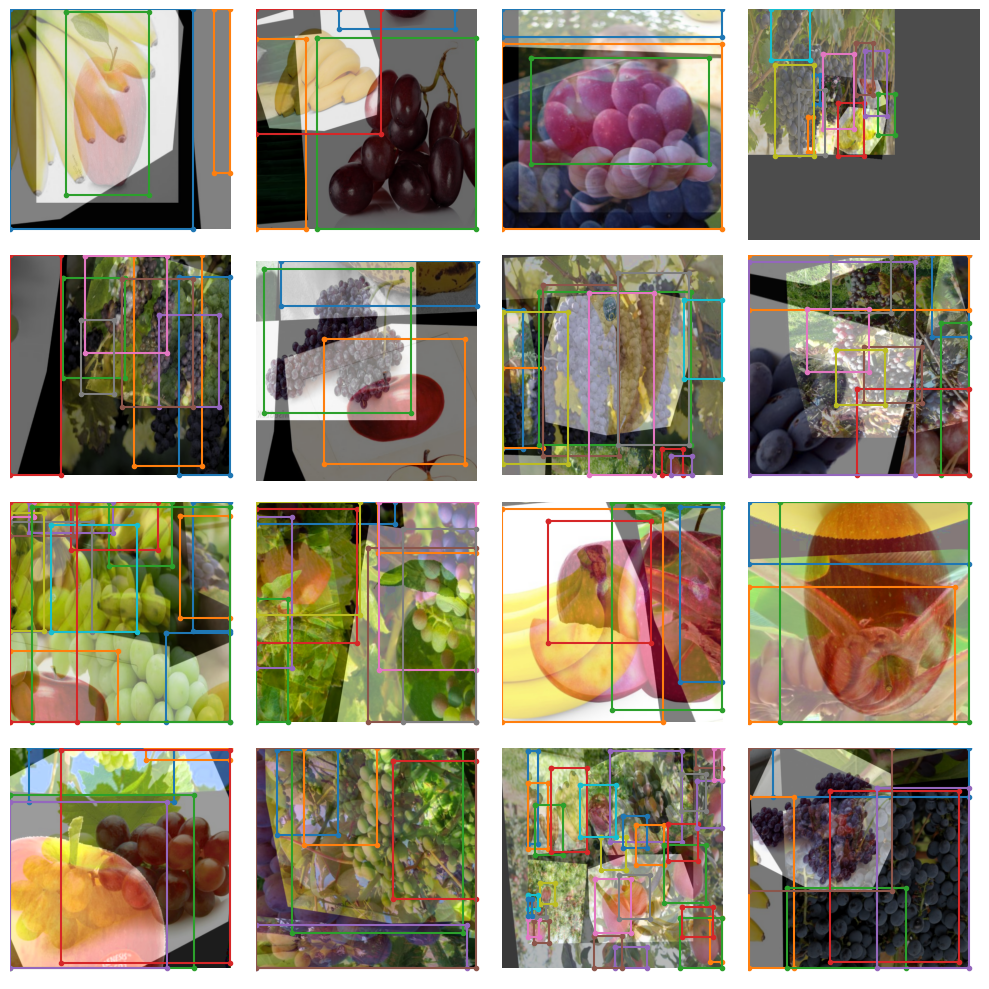

In [8]:
train_data.dataset.plot()

## Step6. Instantiating the model
- You saw how to instantiate the model for inference earlier. 
- Below is how to instantiate the model for finetuning. Note you need to add the `num_classes` argument here.
- Note, for this tutorial we are using `yolo_nas_s`, but SuperGradients has two other flavors of YOLONAS available to you: `yolo_nas_m` and `yolo_nas_l`.

In [4]:
from super_gradients.training import models

In [10]:
from super_gradients.training import models

import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"
print(device)

model = models.get('yolo_nas_l', 
                   num_classes=len(dataset_params['classes']), 
                   pretrained_weights="coco"
                   )

model = model.to(device)


[2023-12-05 15:00:47] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-05 15:00:48] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


## Step7. Define metrics and training parameters
We need to define the training parameters for your training run. 

Full details about the training parameters can be found [here](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### There are a few **mandatory** arguments that we must define for training params

- `max_epochs` - Max number of training epochs

- `loss` - the loss function you want to use

- `optimizer` - Optimizer you will be using

- `train_metrics_list` - Metrics to log during training

- `valid_metrics_list` - Metrics to log during training

- `metric_to_watch` - metric which the model checkpoint will be saved according to

We can choose from a variety of `optimizer`'s such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into `optimizer_params`. 


In [11]:
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050

In [14]:
train_params = {
    "silent_mode": False,   # Silents the Print outs
    "average_best_models":True, # If set, a snapshot dictionary file and the average model will be saved
    "warmup_mode": "LinearEpochLRWarmup", # learning rate warmup scheme, currently ['LinearEpochLRWarmup', 'LinearEpochLRWarmup', 'LinearBatchLRWarmup'] are supported
    "warmup_initial_lr": 1e-6,  # Initial lr for LinearEpochLRWarmup/LinearBatchLRWarmup. When none is given, initial_lr/(warmup_epochs+1) will be used.
    "lr_warmup_epochs": 3,  # number of epochs for learning rate warm up - see https://arxiv.org/pdf/1706.02677.pdf (Section 2.2).
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 20,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50' # which is mean average precision with IOU of 0.5
}

## Step8. Training the model

You've covered a lot of ground so far:

✅ Instantiated the trainer

✅ Defined your dataset parameters and dataloaders

✅ Instantiated a model

✅ Set up your training parameters

### Now, its time to train a model 

Training a model using a SuperGradients is done using the `trainer`.

It's as easy as...

In [15]:
trainer.train(model=model, 
              training_params=train_params, 
              train_loader=train_data, 
              valid_loader=val_data)

[2023-12-05 15:03:14] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231205_150314_887852`
[2023-12-05 15:03:14] INFO - sg_trainer.py - Checkpoints directory: Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852


The console stream is now moved to Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852/console_Dec05_15_03_14.txt


[2023-12-05 15:03:15] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-12-05 15:04:18] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            570        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         35         (len(train_loader))
    - Gradient updates per epoch:   35         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_L  (66.91M parameters, 66.91M optimized)
    - Learning Rates and Weight Decays:
      - default: (66.91M parameters). LR: 0.0005 (66.91M parameters) WD: 0.0, (84.69K para

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.1253
│   ├── Ppyoloeloss/loss_iou = 0.7065
│   ├── Ppyoloeloss/loss_dfl = 0.8617
│   └── Ppyoloeloss/loss = 3.6936
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.2856
    ├── Ppyoloeloss/loss_iou = 0.589
    ├── Ppyoloeloss/loss_dfl = 0.8283
    ├── Ppyoloeloss/loss = 3.703
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.02
    └── F1@0.50 = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:22<00:00, 11.29s/it]
[2023-12-05 15:18:49] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 15:18:49] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.2007405012845993


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.4666
│   │   ├── Epoch N-1      = 2.1253 (↘ -0.6586)
│   │   └── Best until now = 2.1253 (↘ -0.6586)
│   ├── Ppyoloeloss/loss_iou = 0.5762
│   │   ├── Epoch N-1      = 0.7065 (↘ -0.1304)
│   │   └── Best until now = 0.7065 (↘ -0.1304)
│   ├── Ppyoloeloss/loss_dfl = 0.7996
│   │   ├── Epoch N-1      = 0.8617 (↘ -0.0622)
│   │   └── Best until now = 0.8617 (↘ -0.0622)
│   └── Ppyoloeloss/loss = 2.8424
│       ├── Epoch N-1      = 3.6936 (↘ -0.8512)
│       └── Best until now = 3.6936 (↘ -0.8512)
└── Validation
    ├── Ppyoloeloss/loss_cls = 3.0439
    │   ├── Epoch N-1      = 2.2856 (↗ 0.7583)
    │   └── Best until now = 2.2856 (↗ 0.7583)
    ├── Ppyoloeloss/loss_iou = 0.7143
    │   ├── Epoch N-1      = 0.589  (↗ 0.1253)
    │   └── Best until now = 0.589  (↗ 0.1253)
    ├── Ppyoloeloss/loss_dfl = 0.9369
    │   ├── Epoch N-1      = 0.8283 (↗ 0.1085)
    │   └── Best until now = 0.8283 (↗ 0.1085)
    ├── Ppyoloeloss/loss = 4

Validating epoch 2: 100%|██████████| 2/2 [00:19<00:00,  9.71s/it]
[2023-12-05 15:25:16] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 15:25:16] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.35626092553138733


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2371
│   │   ├── Epoch N-1      = 1.4666 (↘ -0.2295)
│   │   └── Best until now = 1.4666 (↘ -0.2295)
│   ├── Ppyoloeloss/loss_iou = 0.5541
│   │   ├── Epoch N-1      = 0.5762 (↘ -0.022)
│   │   └── Best until now = 0.5762 (↘ -0.022)
│   ├── Ppyoloeloss/loss_dfl = 0.7754
│   │   ├── Epoch N-1      = 0.7996 (↘ -0.0242)
│   │   └── Best until now = 0.7996 (↘ -0.0242)
│   └── Ppyoloeloss/loss = 2.5667
│       ├── Epoch N-1      = 2.8424 (↘ -0.2757)
│       └── Best until now = 2.8424 (↘ -0.2757)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.4127
    │   ├── Epoch N-1      = 3.0439 (↗ 1.3689)
    │   └── Best until now = 2.2856 (↗ 2.1271)
    ├── Ppyoloeloss/loss_iou = 0.6037
    │   ├── Epoch N-1      = 0.7143 (↘ -0.1106)
    │   └── Best until now = 0.589  (↗ 0.0147)
    ├── Ppyoloeloss/loss_dfl = 0.8629
    │   ├── Epoch N-1      = 0.9369 (↘ -0.0739)
    │   └── Best until now = 0.8283 (↗ 0.0346)
    ├── Ppyoloeloss/loss = 5

Validating epoch 3: 100%|██████████| 2/2 [00:19<00:00,  9.62s/it]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2186
│   │   ├── Epoch N-1      = 1.2371 (↘ -0.0185)
│   │   └── Best until now = 1.2371 (↘ -0.0185)
│   ├── Ppyoloeloss/loss_iou = 0.5468
│   │   ├── Epoch N-1      = 0.5541 (↘ -0.0073)
│   │   └── Best until now = 0.5541 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.7698
│   │   ├── Epoch N-1      = 0.7754 (↘ -0.0055)
│   │   └── Best until now = 0.7754 (↘ -0.0055)
│   └── Ppyoloeloss/loss = 2.5352
│       ├── Epoch N-1      = 2.5667 (↘ -0.0314)
│       └── Best until now = 2.5667 (↘ -0.0314)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.3151
    │   ├── Epoch N-1      = 4.4127 (↘ -0.0976)
    │   └── Best until now = 2.2856 (↗ 2.0295)
    ├── Ppyoloeloss/loss_iou = 0.6074
    │   ├── Epoch N-1      = 0.6037 (↗ 0.0036)
    │   └── Best until now = 0.589  (↗ 0.0183)
    ├── Ppyoloeloss/loss_dfl = 0.9868
    │   ├── Epoch N-1      = 0.8629 (↗ 0.1238)
    │   └── Best until now = 0.8283 (↗ 0.1584)
    ├── Ppyoloeloss/loss = 

Validating epoch 4: 100%|██████████| 2/2 [00:19<00:00,  9.91s/it]
[2023-12-05 15:38:24] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 15:38:24] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.40006569027900696


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2137
│   │   ├── Epoch N-1      = 1.2186 (↘ -0.0049)
│   │   └── Best until now = 1.2186 (↘ -0.0049)
│   ├── Ppyoloeloss/loss_iou = 0.5341
│   │   ├── Epoch N-1      = 0.5468 (↘ -0.0127)
│   │   └── Best until now = 0.5468 (↘ -0.0127)
│   ├── Ppyoloeloss/loss_dfl = 0.759
│   │   ├── Epoch N-1      = 0.7698 (↘ -0.0109)
│   │   └── Best until now = 0.7698 (↘ -0.0109)
│   └── Ppyoloeloss/loss = 2.5067
│       ├── Epoch N-1      = 2.5352 (↘ -0.0285)
│       └── Best until now = 2.5352 (↘ -0.0285)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9615
    │   ├── Epoch N-1      = 4.3151 (↘ -2.3536)
    │   └── Best until now = 2.2856 (↘ -0.3241)
    ├── Ppyoloeloss/loss_iou = 0.5626
    │   ├── Epoch N-1      = 0.6074 (↘ -0.0447)
    │   └── Best until now = 0.589  (↘ -0.0264)
    ├── Ppyoloeloss/loss_dfl = 0.8243
    │   ├── Epoch N-1      = 0.9868 (↘ -0.1625)
    │   └── Best until now = 0.8283 (↘ -0.0041)
    ├── Ppyoloeloss/los

Validating epoch 5: 100%|██████████| 2/2 [00:19<00:00,  9.72s/it]
[2023-12-05 15:45:01] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 15:45:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.41991913318634033


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2032
│   │   ├── Epoch N-1      = 1.2137 (↘ -0.0105)
│   │   └── Best until now = 1.2137 (↘ -0.0105)
│   ├── Ppyoloeloss/loss_iou = 0.5191
│   │   ├── Epoch N-1      = 0.5341 (↘ -0.0149)
│   │   └── Best until now = 0.5341 (↘ -0.0149)
│   ├── Ppyoloeloss/loss_dfl = 0.7447
│   │   ├── Epoch N-1      = 0.759  (↘ -0.0143)
│   │   └── Best until now = 0.759  (↘ -0.0143)
│   └── Ppyoloeloss/loss = 2.467
│       ├── Epoch N-1      = 2.5067 (↘ -0.0397)
│       └── Best until now = 2.5067 (↘ -0.0397)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.374
    │   ├── Epoch N-1      = 1.9615 (↘ -0.5875)
    │   └── Best until now = 1.9615 (↘ -0.5875)
    ├── Ppyoloeloss/loss_iou = 0.6035
    │   ├── Epoch N-1      = 0.5626 (↗ 0.0409)
    │   └── Best until now = 0.5626 (↗ 0.0409)
    ├── Ppyoloeloss/loss_dfl = 0.8607
    │   ├── Epoch N-1      = 0.8243 (↗ 0.0365)
    │   └── Best until now = 0.8243 (↗ 0.0365)
    ├── Ppyoloeloss/loss = 2

Validating epoch 6: 100%|██████████| 2/2 [00:17<00:00,  8.86s/it]
[2023-12-05 15:51:31] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 15:51:31] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5645617842674255


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1629
│   │   ├── Epoch N-1      = 1.2032 (↘ -0.0403)
│   │   └── Best until now = 1.2032 (↘ -0.0403)
│   ├── Ppyoloeloss/loss_iou = 0.5135
│   │   ├── Epoch N-1      = 0.5191 (↘ -0.0057)
│   │   └── Best until now = 0.5191 (↘ -0.0057)
│   ├── Ppyoloeloss/loss_dfl = 0.7358
│   │   ├── Epoch N-1      = 0.7447 (↘ -0.0088)
│   │   └── Best until now = 0.7447 (↘ -0.0088)
│   └── Ppyoloeloss/loss = 2.4122
│       ├── Epoch N-1      = 2.467  (↘ -0.0548)
│       └── Best until now = 2.467  (↘ -0.0548)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3359
    │   ├── Epoch N-1      = 1.374  (↘ -0.0382)
    │   └── Best until now = 1.374  (↘ -0.0382)
    ├── Ppyoloeloss/loss_iou = 0.5367
    │   ├── Epoch N-1      = 0.6035 (↘ -0.0668)
    │   └── Best until now = 0.5626 (↘ -0.026)
    ├── Ppyoloeloss/loss_dfl = 0.7691
    │   ├── Epoch N-1      = 0.8607 (↘ -0.0917)
    │   └── Best until now = 0.8243 (↘ -0.0552)
    ├── Ppyoloeloss/los

Validating epoch 7: 100%|██████████| 2/2 [00:21<00:00, 10.94s/it]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1657
│   │   ├── Epoch N-1      = 1.1629 (↗ 0.0028)
│   │   └── Best until now = 1.1629 (↗ 0.0028)
│   ├── Ppyoloeloss/loss_iou = 0.487
│   │   ├── Epoch N-1      = 0.5135 (↘ -0.0265)
│   │   └── Best until now = 0.5135 (↘ -0.0265)
│   ├── Ppyoloeloss/loss_dfl = 0.7121
│   │   ├── Epoch N-1      = 0.7358 (↘ -0.0237)
│   │   └── Best until now = 0.7358 (↘ -0.0237)
│   └── Ppyoloeloss/loss = 2.3648
│       ├── Epoch N-1      = 2.4122 (↘ -0.0474)
│       └── Best until now = 2.4122 (↘ -0.0474)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3133
    │   ├── Epoch N-1      = 1.3359 (↘ -0.0225)
    │   └── Best until now = 1.3359 (↘ -0.0225)
    ├── Ppyoloeloss/loss_iou = 0.5322
    │   ├── Epoch N-1      = 0.5367 (↘ -0.0045)
    │   └── Best until now = 0.5367 (↘ -0.0045)
    ├── Ppyoloeloss/loss_dfl = 0.7738
    │   ├── Epoch N-1      = 0.7691 (↗ 0.0048)
    │   └── Best until now = 0.7691 (↗ 0.0048)
    ├── Ppyoloeloss/loss = 

Validating epoch 8: 100%|██████████| 2/2 [00:18<00:00,  9.15s/it]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.132
│   │   ├── Epoch N-1      = 1.1657 (↘ -0.0336)
│   │   └── Best until now = 1.1629 (↘ -0.0308)
│   ├── Ppyoloeloss/loss_iou = 0.4761
│   │   ├── Epoch N-1      = 0.487  (↘ -0.0109)
│   │   └── Best until now = 0.487  (↘ -0.0109)
│   ├── Ppyoloeloss/loss_dfl = 0.6997
│   │   ├── Epoch N-1      = 0.7121 (↘ -0.0124)
│   │   └── Best until now = 0.7121 (↘ -0.0124)
│   └── Ppyoloeloss/loss = 2.3078
│       ├── Epoch N-1      = 2.3648 (↘ -0.057)
│       └── Best until now = 2.3648 (↘ -0.057)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.408
    │   ├── Epoch N-1      = 1.3133 (↗ 0.0947)
    │   └── Best until now = 1.3133 (↗ 0.0947)
    ├── Ppyoloeloss/loss_iou = 0.56
    │   ├── Epoch N-1      = 0.5322 (↗ 0.0278)
    │   └── Best until now = 0.5322 (↗ 0.0278)
    ├── Ppyoloeloss/loss_dfl = 0.7991
    │   ├── Epoch N-1      = 0.7738 (↗ 0.0253)
    │   └── Best until now = 0.7691 (↗ 0.03)
    ├── Ppyoloeloss/loss = 2.7671
  

Validating epoch 9: 100%|██████████| 2/2 [00:17<00:00,  8.87s/it]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1462
│   │   ├── Epoch N-1      = 1.132  (↗ 0.0141)
│   │   └── Best until now = 1.132  (↗ 0.0141)
│   ├── Ppyoloeloss/loss_iou = 0.4802
│   │   ├── Epoch N-1      = 0.4761 (↗ 0.0041)
│   │   └── Best until now = 0.4761 (↗ 0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.7046
│   │   ├── Epoch N-1      = 0.6997 (↗ 0.0049)
│   │   └── Best until now = 0.6997 (↗ 0.0049)
│   └── Ppyoloeloss/loss = 2.331
│       ├── Epoch N-1      = 2.3078 (↗ 0.0231)
│       └── Best until now = 2.3078 (↗ 0.0231)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3595
    │   ├── Epoch N-1      = 1.408  (↘ -0.0485)
    │   └── Best until now = 1.3133 (↗ 0.0462)
    ├── Ppyoloeloss/loss_iou = 0.5454
    │   ├── Epoch N-1      = 0.56   (↘ -0.0146)
    │   └── Best until now = 0.5322 (↗ 0.0131)
    ├── Ppyoloeloss/loss_dfl = 0.7834
    │   ├── Epoch N-1      = 0.7991 (↘ -0.0157)
    │   └── Best until now = 0.7691 (↗ 0.0144)
    ├── Ppyoloeloss/loss = 2.6883


Validating epoch 10: 100%|██████████| 2/2 [00:20<00:00, 10.20s/it]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1087
│   │   ├── Epoch N-1      = 1.1462 (↘ -0.0375)
│   │   └── Best until now = 1.132  (↘ -0.0233)
│   ├── Ppyoloeloss/loss_iou = 0.4596
│   │   ├── Epoch N-1      = 0.4802 (↘ -0.0205)
│   │   └── Best until now = 0.4761 (↘ -0.0165)
│   ├── Ppyoloeloss/loss_dfl = 0.6887
│   │   ├── Epoch N-1      = 0.7046 (↘ -0.0159)
│   │   └── Best until now = 0.6997 (↘ -0.011)
│   └── Ppyoloeloss/loss = 2.2571
│       ├── Epoch N-1      = 2.331  (↘ -0.0739)
│       └── Best until now = 2.3078 (↘ -0.0508)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1533
    │   ├── Epoch N-1      = 1.3595 (↘ -0.2062)
    │   └── Best until now = 1.3133 (↘ -0.16)
    ├── Ppyoloeloss/loss_iou = 0.5479
    │   ├── Epoch N-1      = 0.5454 (↗ 0.0025)
    │   └── Best until now = 0.5322 (↗ 0.0157)
    ├── Ppyoloeloss/loss_dfl = 0.7798
    │   ├── Epoch N-1      = 0.7834 (↘ -0.0037)
    │   └── Best until now = 0.7691 (↗ 0.0107)
    ├── Ppyoloeloss/loss = 

Validating epoch 11: 100%|██████████| 2/2 [00:20<00:00, 10.35s/it]
[2023-12-05 16:26:33] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 16:26:33] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6010439991950989


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0912
│   │   ├── Epoch N-1      = 1.1087 (↘ -0.0175)
│   │   └── Best until now = 1.1087 (↘ -0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.4582
│   │   ├── Epoch N-1      = 0.4596 (↘ -0.0015)
│   │   └── Best until now = 0.4596 (↘ -0.0015)
│   ├── Ppyoloeloss/loss_dfl = 0.6868
│   │   ├── Epoch N-1      = 0.6887 (↘ -0.0019)
│   │   └── Best until now = 0.6887 (↘ -0.0019)
│   └── Ppyoloeloss/loss = 2.2362
│       ├── Epoch N-1      = 2.2571 (↘ -0.0208)
│       └── Best until now = 2.2571 (↘ -0.0208)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1476
    │   ├── Epoch N-1      = 1.1533 (↘ -0.0058)
    │   └── Best until now = 1.1533 (↘ -0.0058)
    ├── Ppyoloeloss/loss_iou = 0.5204
    │   ├── Epoch N-1      = 0.5479 (↘ -0.0275)
    │   └── Best until now = 0.5322 (↘ -0.0119)
    ├── Ppyoloeloss/loss_dfl = 0.7515
    │   ├── Epoch N-1      = 0.7798 (↘ -0.0283)
    │   └── Best until now = 0.7691 (↘ -0.0176)
    ├── Ppyoloeloss/l

Validating epoch 12: 100%|██████████| 2/2 [00:21<00:00, 10.91s/it]
[2023-12-05 16:34:14] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 16:34:14] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6398027539253235


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0679
│   │   ├── Epoch N-1      = 1.0912 (↘ -0.0234)
│   │   └── Best until now = 1.0912 (↘ -0.0234)
│   ├── Ppyoloeloss/loss_iou = 0.4528
│   │   ├── Epoch N-1      = 0.4582 (↘ -0.0054)
│   │   └── Best until now = 0.4582 (↘ -0.0054)
│   ├── Ppyoloeloss/loss_dfl = 0.6751
│   │   ├── Epoch N-1      = 0.6868 (↘ -0.0118)
│   │   └── Best until now = 0.6868 (↘ -0.0118)
│   └── Ppyoloeloss/loss = 2.1957
│       ├── Epoch N-1      = 2.2362 (↘ -0.0405)
│       └── Best until now = 2.2362 (↘ -0.0405)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0706
    │   ├── Epoch N-1      = 1.1476 (↘ -0.0769)
    │   └── Best until now = 1.1476 (↘ -0.0769)
    ├── Ppyoloeloss/loss_iou = 0.4971
    │   ├── Epoch N-1      = 0.5204 (↘ -0.0233)
    │   └── Best until now = 0.5204 (↘ -0.0233)
    ├── Ppyoloeloss/loss_dfl = 0.7127
    │   ├── Epoch N-1      = 0.7515 (↘ -0.0388)
    │   └── Best until now = 0.7515 (↘ -0.0388)
    ├── Ppyoloeloss/l

Validating epoch 13: 100%|██████████| 2/2 [00:21<00:00, 10.74s/it]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0738
│   │   ├── Epoch N-1      = 1.0679 (↗ 0.0059)
│   │   └── Best until now = 1.0679 (↗ 0.0059)
│   ├── Ppyoloeloss/loss_iou = 0.4517
│   │   ├── Epoch N-1      = 0.4528 (↘ -0.0011)
│   │   └── Best until now = 0.4528 (↘ -0.0011)
│   ├── Ppyoloeloss/loss_dfl = 0.6743
│   │   ├── Epoch N-1      = 0.6751 (↘ -0.0008)
│   │   └── Best until now = 0.6751 (↘ -0.0008)
│   └── Ppyoloeloss/loss = 2.1998
│       ├── Epoch N-1      = 2.1957 (↗ 0.0041)
│       └── Best until now = 2.1957 (↗ 0.0041)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1144
    │   ├── Epoch N-1      = 1.0706 (↗ 0.0437)
    │   └── Best until now = 1.0706 (↗ 0.0437)
    ├── Ppyoloeloss/loss_iou = 0.5148
    │   ├── Epoch N-1      = 0.4971 (↗ 0.0177)
    │   └── Best until now = 0.4971 (↗ 0.0177)
    ├── Ppyoloeloss/loss_dfl = 0.7357
    │   ├── Epoch N-1      = 0.7127 (↗ 0.0231)
    │   └── Best until now = 0.7127 (↗ 0.0231)
    ├── Ppyoloeloss/loss = 2.36

Validating epoch 14: 100%|██████████| 2/2 [00:21<00:00, 10.80s/it]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0391
│   │   ├── Epoch N-1      = 1.0738 (↘ -0.0347)
│   │   └── Best until now = 1.0679 (↘ -0.0288)
│   ├── Ppyoloeloss/loss_iou = 0.4332
│   │   ├── Epoch N-1      = 0.4517 (↘ -0.0185)
│   │   └── Best until now = 0.4517 (↘ -0.0185)
│   ├── Ppyoloeloss/loss_dfl = 0.6496
│   │   ├── Epoch N-1      = 0.6743 (↘ -0.0247)
│   │   └── Best until now = 0.6743 (↘ -0.0247)
│   └── Ppyoloeloss/loss = 2.1219
│       ├── Epoch N-1      = 2.1998 (↘ -0.0778)
│       └── Best until now = 2.1957 (↘ -0.0738)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1339
    │   ├── Epoch N-1      = 1.1144 (↗ 0.0196)
    │   └── Best until now = 1.0706 (↗ 0.0633)
    ├── Ppyoloeloss/loss_iou = 0.5088
    │   ├── Epoch N-1      = 0.5148 (↘ -0.006)
    │   └── Best until now = 0.4971 (↗ 0.0117)
    ├── Ppyoloeloss/loss_dfl = 0.7149
    │   ├── Epoch N-1      = 0.7357 (↘ -0.0208)
    │   └── Best until now = 0.7127 (↗ 0.0023)
    ├── Ppyoloeloss/loss =

Validating epoch 15: 100%|██████████| 2/2 [00:21<00:00, 10.89s/it]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0268
│   │   ├── Epoch N-1      = 1.0391 (↘ -0.0123)
│   │   └── Best until now = 1.0391 (↘ -0.0123)
│   ├── Ppyoloeloss/loss_iou = 0.4233
│   │   ├── Epoch N-1      = 0.4332 (↘ -0.0099)
│   │   └── Best until now = 0.4332 (↘ -0.0099)
│   ├── Ppyoloeloss/loss_dfl = 0.647
│   │   ├── Epoch N-1      = 0.6496 (↘ -0.0027)
│   │   └── Best until now = 0.6496 (↘ -0.0027)
│   └── Ppyoloeloss/loss = 2.0971
│       ├── Epoch N-1      = 2.1219 (↘ -0.0249)
│       └── Best until now = 2.1219 (↘ -0.0249)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.122
    │   ├── Epoch N-1      = 1.1339 (↘ -0.0119)
    │   └── Best until now = 1.0706 (↗ 0.0514)
    ├── Ppyoloeloss/loss_iou = 0.5224
    │   ├── Epoch N-1      = 0.5088 (↗ 0.0136)
    │   └── Best until now = 0.4971 (↗ 0.0253)
    ├── Ppyoloeloss/loss_dfl = 0.7338
    │   ├── Epoch N-1      = 0.7149 (↗ 0.0189)
    │   └── Best until now = 0.7127 (↗ 0.0212)
    ├── Ppyoloeloss/loss = 2

Validating epoch 16: 100%|██████████| 2/2 [00:21<00:00, 10.78s/it]
[2023-12-05 17:04:42] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 17:04:42] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6637051701545715


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0311
│   │   ├── Epoch N-1      = 1.0268 (↗ 0.0043)
│   │   └── Best until now = 1.0268 (↗ 0.0043)
│   ├── Ppyoloeloss/loss_iou = 0.4201
│   │   ├── Epoch N-1      = 0.4233 (↘ -0.0031)
│   │   └── Best until now = 0.4233 (↘ -0.0031)
│   ├── Ppyoloeloss/loss_dfl = 0.6519
│   │   ├── Epoch N-1      = 0.647  (↗ 0.0049)
│   │   └── Best until now = 0.647  (↗ 0.0049)
│   └── Ppyoloeloss/loss = 2.1032
│       ├── Epoch N-1      = 2.0971 (↗ 0.0061)
│       └── Best until now = 2.0971 (↗ 0.0061)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0318
    │   ├── Epoch N-1      = 1.122  (↘ -0.0902)
    │   └── Best until now = 1.0706 (↘ -0.0388)
    ├── Ppyoloeloss/loss_iou = 0.5368
    │   ├── Epoch N-1      = 0.5224 (↗ 0.0145)
    │   └── Best until now = 0.4971 (↗ 0.0398)
    ├── Ppyoloeloss/loss_dfl = 0.749
    │   ├── Epoch N-1      = 0.7338 (↗ 0.0152)
    │   └── Best until now = 0.7127 (↗ 0.0364)
    ├── Ppyoloeloss/loss = 2.317

Validating epoch 17: 100%|██████████| 2/2 [00:23<00:00, 11.98s/it]
[2023-12-05 17:13:40] INFO - base_sg_logger.py - Checkpoint saved in Ckpt_fuits_detection\Fuits_detection_V01\RUN_20231205_150314_887852\ckpt_best.pth
[2023-12-05 17:13:40] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6863911747932434


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0066
│   │   ├── Epoch N-1      = 1.0311 (↘ -0.0246)
│   │   └── Best until now = 1.0268 (↘ -0.0203)
│   ├── Ppyoloeloss/loss_iou = 0.4223
│   │   ├── Epoch N-1      = 0.4201 (↗ 0.0021)
│   │   └── Best until now = 0.4201 (↗ 0.0021)
│   ├── Ppyoloeloss/loss_dfl = 0.6488
│   │   ├── Epoch N-1      = 0.6519 (↘ -0.0031)
│   │   └── Best until now = 0.647  (↗ 0.0019)
│   └── Ppyoloeloss/loss = 2.0777
│       ├── Epoch N-1      = 2.1032 (↘ -0.0255)
│       └── Best until now = 2.0971 (↘ -0.0194)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0625
    │   ├── Epoch N-1      = 1.0318 (↗ 0.0307)
    │   └── Best until now = 1.0318 (↗ 0.0307)
    ├── Ppyoloeloss/loss_iou = 0.53
    │   ├── Epoch N-1      = 0.5368 (↘ -0.0069)
    │   └── Best until now = 0.4971 (↗ 0.0329)
    ├── Ppyoloeloss/loss_dfl = 0.7441
    │   ├── Epoch N-1      = 0.749  (↘ -0.0049)
    │   └── Best until now = 0.7127 (↗ 0.0314)
    ├── Ppyoloeloss/loss = 2.3

Validating epoch 18: 100%|██████████| 2/2 [00:24<00:00, 12.12s/it]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9954
│   │   ├── Epoch N-1      = 1.0066 (↘ -0.0112)
│   │   └── Best until now = 1.0066 (↘ -0.0112)
│   ├── Ppyoloeloss/loss_iou = 0.4229
│   │   ├── Epoch N-1      = 0.4223 (↗ 0.0006)
│   │   └── Best until now = 0.4201 (↗ 0.0027)
│   ├── Ppyoloeloss/loss_dfl = 0.6362
│   │   ├── Epoch N-1      = 0.6488 (↘ -0.0127)
│   │   └── Best until now = 0.647  (↘ -0.0108)
│   └── Ppyoloeloss/loss = 2.0545
│       ├── Epoch N-1      = 2.0777 (↘ -0.0232)
│       └── Best until now = 2.0777 (↘ -0.0232)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0615
    │   ├── Epoch N-1      = 1.0625 (↘ -0.001)
    │   └── Best until now = 1.0318 (↗ 0.0297)
    ├── Ppyoloeloss/loss_iou = 0.5351
    │   ├── Epoch N-1      = 0.53   (↗ 0.0051)
    │   └── Best until now = 0.4971 (↗ 0.038)
    ├── Ppyoloeloss/loss_dfl = 0.7544
    │   ├── Epoch N-1      = 0.7441 (↗ 0.0103)
    │   └── Best until now = 0.7127 (↗ 0.0417)
    ├── Ppyoloeloss/loss = 2.3

Validating epoch 19: 100%|██████████| 2/2 [00:17<00:00,  8.95s/it]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9775
│   │   ├── Epoch N-1      = 0.9954 (↘ -0.0179)
│   │   └── Best until now = 0.9954 (↘ -0.0179)
│   ├── Ppyoloeloss/loss_iou = 0.4118
│   │   ├── Epoch N-1      = 0.4229 (↘ -0.0111)
│   │   └── Best until now = 0.4201 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.6209
│   │   ├── Epoch N-1      = 0.6362 (↘ -0.0153)
│   │   └── Best until now = 0.6362 (↘ -0.0153)
│   └── Ppyoloeloss/loss = 2.0102
│       ├── Epoch N-1      = 2.0545 (↘ -0.0442)
│       └── Best until now = 2.0545 (↘ -0.0442)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1105
    │   ├── Epoch N-1      = 1.0615 (↗ 0.049)
    │   └── Best until now = 1.0318 (↗ 0.0788)
    ├── Ppyoloeloss/loss_iou = 0.5289
    │   ├── Epoch N-1      = 0.5351 (↘ -0.0062)
    │   └── Best until now = 0.4971 (↗ 0.0318)
    ├── Ppyoloeloss/loss_dfl = 0.7439
    │   ├── Epoch N-1      = 0.7544 (↘ -0.0105)
    │   └── Best until now = 0.7127 (↗ 0.0313)
    ├── Ppyoloeloss/loss =

[2023-12-05 17:29:43] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 20: 100%|██████████| 2/2 [00:18<00:00,  9.27s/it]


[2023-12-05 17:30:03] INFO - base_sg_logger.py - [CLEANUP] - Successfully stopped system monitoring process


## Step9. Best 모델 가져오기

In [5]:
%cd {HOME}

f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset


In [8]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"
print(device)

best_model = models.get('yolo_nas_l',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path=f"{HOME}/Ckpt_fuits_detection/Fuits_detection_V01/RUN_20231205_150314_887852/ckpt_best.pth")

best_model = best_model.to(device)

cuda


[2023-12-06 12:27:03] INFO - checkpoint_utils.py - Successfully loaded model weights from f:\00_Study\00_Project_and_Practice\005_AI_P__YOLO-NAS_Fruit_Detection\YOLO-NAS_Fruits_detection_using_custom_dataset/Ckpt_fuits_detection/Fuits_detection_V01/RUN_20231205_150314_887852/ckpt_best.pth EMA checkpoint.


## Step10. Model 평가

In [18]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1, 
                                                   top_k_predictions=300, 
                                                   num_cls=len(dataset_params['classes']), 
                                                   normalize_targets=True, 
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01, 
                                                                                                          nms_top_k=1000, 
                                                                                                          max_predictions=300,                                                                              
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing: 100%|██████████| 1/1 [00:17<00:00, 17.87s/it]

{'PPYoloELoss/loss_cls': 0.9137275,
 'PPYoloELoss/loss_iou': 0.33927238,
 'PPYoloELoss/loss_dfl': 0.6699618,
 'PPYoloELoss/loss': 1.9229617,
 'Precision@0.50': 0.02477068454027176,
 'Recall@0.50': 1.0,
 'mAP@0.50': 0.8516544699668884,
 'F1@0.50': 0.048057954758405685}

Testing: 100%|██████████| 1/1 [00:19<00:00, 19.03s/it]


## Step11. 예상하기

In [38]:
# 이미지 Test
!del {HOME}\pred_0.jpg

img_url = f'{HOME}/healthy-5506822_640.jpg'
output_img_url = f'{HOME}'
best_model.predict(img_url, conf=0.5).save(output_img_url)

[2023-12-06 12:57:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


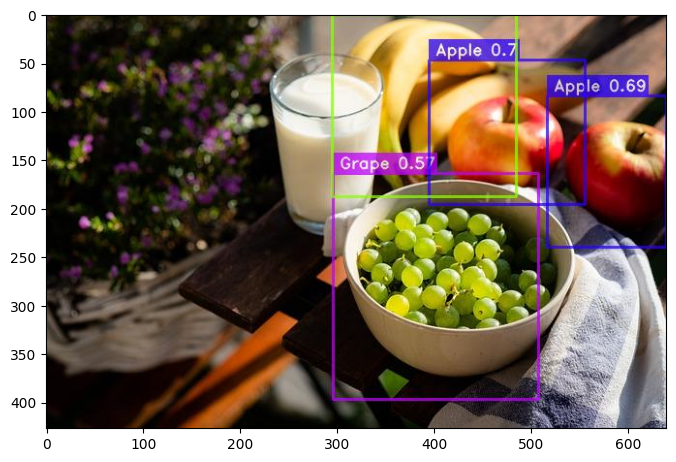

In [39]:
import cv2
import matplotlib.pyplot as plt

img_path = f'{HOME}/pred_0.jpg'
detection_img = cv2.imread(img_path)
detection_img = cv2.cvtColor(detection_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(detection_img)

In [20]:
# 영상 Test
!del {HOME}\autumn_-_27932_540p_detection.mp4

input_video=f'{HOME}/autumn_-_27932_540p.mp4'
output_video=f'{HOME}/autumn_-_27932_540p_detection.mp4'

best_model.predict(input_video, conf=0.5).save(output_video)

Processing Video: 100%|██████████| 399/399 [00:15<00:00, 26.56it/s]


In [21]:
from IPython.display import HTML
from base64 import b64encode

!del {HOME}\autumn_-_27932_540p_detection_compressed.mp4

# Input video path
input_path = f'{HOME}/autumn_-_27932_540p_detection.mp4'

# Compressed video path
compressed_path = f"{HOME}/autumn_-_27932_540p_detection_compressed.mp4"

os.system(f"ffmpeg -i {input_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=900 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [8]:
#import cv2
best_model.predict_webcam(conf=0.45)

[2023-12-05 18:34:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


KeyboardInterrupt: 

: 